In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Show Code"></form>''')

# Data Spaces Thesis
#### Antonio Alliegro, s250104, antonio.alliegro@studenti.polito.it

In [2]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
# seaborn paper context
sns.set_context("paper", font_scale=1.4)
sns.set(style="whitegrid")


In [3]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import Contours, Histogram2dContour, Marker, Scatter, Data, Layout, Figure
import plotly.tools as tools

init_notebook_mode()
# Function def: needed for using Plotly in Google Colab
# Call it in each offline plotting cell
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        ''')) 

In [4]:
def GridSearch_table_plot(grid_clf, param_name,
                          num_results=15,
                          negative=True,
                          graph=True,
                          display_all_params=True):

    from matplotlib      import pyplot as plt
    from IPython.display import display
    import pandas as pd

    clf = grid_clf.best_estimator_
    clf_params = grid_clf.best_params_
    if negative:
        clf_score = -grid_clf.best_score_
    else:
        clf_score = grid_clf.best_score_
    clf_stdev = grid_clf.cv_results_['std_test_score'][grid_clf.best_index_]
    cv_results = grid_clf.cv_results_

    print("best parameters: {}".format(clf_params))
    print("best score:      {:0.5f} (+/-{:0.5f})".format(clf_score, clf_stdev))
    if display_all_params:
        import pprint
        pprint.pprint(clf.get_params())

    # pick out the best results
    # =========================
    scores_df = pd.DataFrame(cv_results).sort_values(by='rank_test_score')

    best_row = scores_df.iloc[0, :]
    if negative:
        best_mean = -best_row['mean_test_score']
    else:
        best_mean = best_row['mean_test_score']
    best_stdev = best_row['std_test_score']
    best_param = best_row['param_' + param_name]

    # display the top 'num_results' results
    # =====================================
    display(pd.DataFrame(cv_results) \
            .sort_values(by='rank_test_score').head(num_results))

    # plot the results
    # ================
    scores_df = scores_df.sort_values(by='param_' + param_name)

    if negative:
        means = -scores_df['mean_test_score']
    else:
        means = scores_df['mean_test_score']
    stds = scores_df['std_test_score']
    params = scores_df['param_' + param_name]

    # plot
    if graph:
        plt.figure(figsize=(8, 8))
        plt.errorbar(params, means, yerr=stds)

        plt.axhline(y=best_mean + best_stdev, color='red')
        plt.axhline(y=best_mean - best_stdev, color='red')
        plt.plot(best_param, best_mean, 'or')

        plt.title(param_name + " vs Score\nBest Score {:0.5f}".format(clf_score))
        plt.xlabel(param_name)
        plt.ylabel('Score')
        plt.show()

### Importing the Dataset

In [5]:
df = pd.read_csv("heart.csv")
print(df.info())
print(df.describe())  # description of statistic features

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
age         303 non-null int64
sex         303 non-null int64
cp          303 non-null int64
trestbps    303 non-null int64
chol        303 non-null int64
fbs         303 non-null int64
restecg     303 non-null int64
thalach     303 non-null int64
exang       303 non-null int64
oldpeak     303 non-null float64
slope       303 non-null int64
ca          303 non-null int64
thal        303 non-null int64
target      303 non-null int64
dtypes: float64(1), int64(13)
memory usage: 33.2 KB
None
              age         sex          cp    trestbps        chol         fbs  \
count  303.000000  303.000000  303.000000  303.000000  303.000000  303.000000   
mean    54.366337    0.683168    0.966997  131.623762  246.264026    0.148515   
std      9.082101    0.466011    1.032052   17.538143   51.830751    0.356198   
min     29.000000    0.000000    0.000000   94.000000  126.000000    0.000000 

# 1. Data Visualization

Once imported the dataset, let's check data distribution. The objective is to gain some insight on features importance in predicting a patient affected or will be by heart diseases.<br>
Which are the most important features to predict a future heart disease affected patient?

### Boxplot (Method)
#### An efficient visual tool for displaying data distribution
The box plot is a  method for graphically displaying the distribution of data based on the five number summary: **minimum, first quartile, median, third quartile, and maximum**.<br>
See picture, the central rectangle spans the first quartile to the third quartile (the interquartile range or IQR).<br>A segment inside the rectangle shows the median while "whiskers" above and below the box show the locations of the minimum and maximum.<br>
<img src="DS_thesis/boxplot_1.png">
<br><br>
Not uncommonly real datasets will display surprisingly high maximums or surprisingly low minimums called outliers.<br>John Tukey definition for **outliers**:<br>
Outliers are either 3×IQR or more above the third quartile or 3×IQR or more below the first quartile.<br>
*Suspected outliers* are are slightly more central versions of outliers: either 1.5×IQR or more above the third quartile or 1.5×IQR or more below the first quartile.<br>
If either type of outlier is present the whisker on the appropriate side is taken to 1.5×IQR from the quartile (the "inner fence") rather than the max or min, and individual outlying data points are displayed as unfilled circles (for suspected outliers) or filled circles (for outliers). (The "outer fence" is 3×IQR from the quartile.)<br>
<img src="DS_thesis/boxplot_2.png">
*rif: http://www.physics.csbsju.edu/stats/box2.html*




### Target Count Plot
This feature distinguish between an healthy man and one affected by heart diseases. In the original dataset (from UCI) this was a cathegorical attribute assuming value from 0 to 4. Where 0 meant no heart diseases at all and numbers from 1 to 4 meant presence of heart diseases.<br>
In our analyzed dataset, target can assume only 0 or 1 values:<br>
<b>1</b> is heart diseases <b>affected</b>,<br> <b>0</b> is <b>not affected</b>

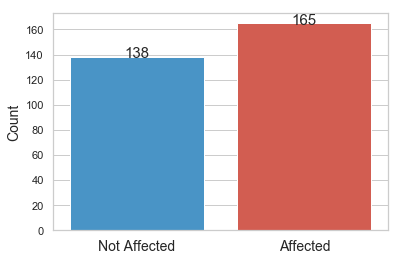

In [6]:
flatui_simple = ["#3498db", "#e74c3c"]
ax=sns.countplot(x='target',data=df, palette=sns.color_palette(flatui_simple));
ax.set_xticklabels(labels=['Not Affected','Affected'], fontsize=14)
ax.set_xlabel('')
ax.set_ylabel("Count",fontsize=14)

for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 3), textcoords = 'offset points', fontsize = 15)

Note that the majority of samples in our dataset are about people who had some kind of heart disease.<br>
Not affected are 138 while Affected are the majority, 165. 

### Sex Distribution

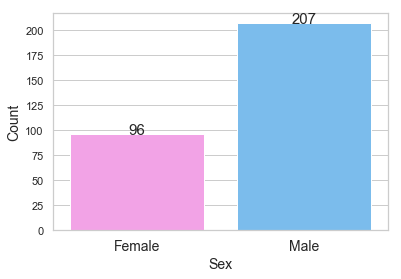

In [7]:
sex_pal = ["#ff96ef", "#68bfff"]
ax = sns.countplot(x='sex',data=df, palette=sns.color_palette(sex_pal));
ax.set_xticklabels(labels=['Female','Male'], fontsize=14);
ax.set_xlabel("Sex",fontsize=14); ax.set_ylabel("Count",fontsize=14);

for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 4), textcoords = 'offset points', fontsize = 15)

Dataset samples are for the majority relative to male patients. Male are more than twice the Female. Our data are biased.

### Affected/Not Affected count w.r.t Sex

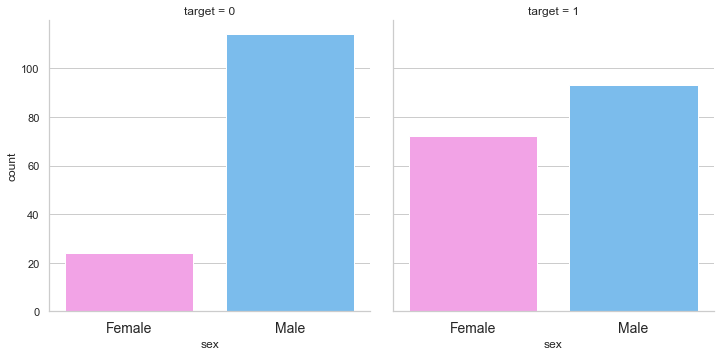

In [8]:
ax1 = sns.catplot(x='sex', col='target', kind='count', data=df, palette=sns.color_palette(sex_pal), estimator=lambda x: len(x));
ax1.set(xticks=[0, 1], xticklabels=['Female', 'Male']);
ax1.set_xticklabels(fontsize=14);

In [9]:
# 1 is for male
# 0 is for female
aff_male = df[(df["target"]==1) & (df["sex"]==1)].count()[0]
aff_female = df[(df["target"]==1) & (df["sex"]==0)].count()[0]
num_male = df[df["sex"]==1].count()[0]
num_female = df[df["sex"]==0].count()[0]
print("Total number of Male subjects is: %d" % num_male)
print("Total number of Female subjects is: %d" % num_female)
print("Number of Heart Diseases Affected male is: %d on %d" % (aff_male, num_male))
print("Number of Heart Diseases Affected female is: %d on %d" % (aff_female, num_female))
male_rate = 100*(aff_male/num_male)  # affected rate for male
female_rate = 100*(aff_female/num_female)  # affected rate for female
print("")
print("Percentage of affected Male: %.02f%% " % male_rate)
print("Percentage of affected Female: %.02f%% " % female_rate)

Total number of Male subjects is: 207
Total number of Female subjects is: 96
Number of Heart Diseases Affected male is: 93 on 207
Number of Heart Diseases Affected female is: 72 on 96

Percentage of affected Male: 44.93% 
Percentage of affected Female: 75.00% 


What we see is that no matter the Male samples predominance in our dataset, seems that the **most affected by heart diseases are Female subjects**.

### Age distribution

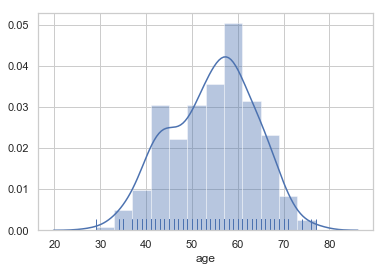

In [10]:
# rug plot draws a small vertical tick at each observation
sns.distplot(df['age'], kde=True, rug=True);

### Age-Target
Quantitative data that we have used is the **age**, and we are comparing it to the categorical variable **target**.

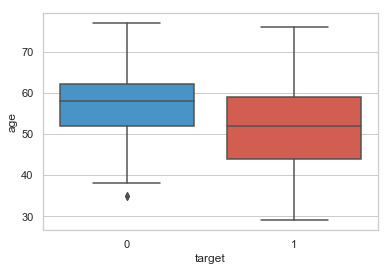

In [11]:
sns.boxplot(x='target',y='age',data=df, palette=sns.color_palette(flatui_simple));

Is interesting to note that the majority of heart diseases affected patient have an AVG age (~50) that is lower than the AVG age of healty people(~60).<br>
Seems that Heart Diseases are more likely to affect people around fifty than people around sixty years old.

### Thalach
Thalach attribute represents the **Maximum heart rate** achieved during thalium stress test.

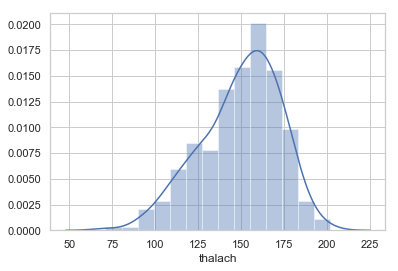

In [12]:
sns.distplot(df['thalach'], kde=True, rug=False);

### Thalach-Target

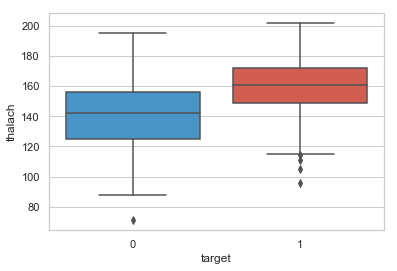

In [13]:
# makes sense... infact 'thalach' represents Thalium Test maximum heart rate achieved
sns.boxplot(x='target',y='thalach',data=df, palette=sns.color_palette(flatui_simple));

Predictably, affected people achieved an higher maximum heart rate, during Thalium stress test, with respect to healty (not affected) people.

### Trestbps
Resting blood pressure. Measured in (mm Hg).

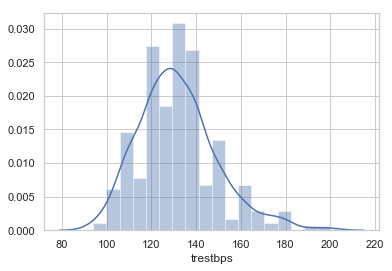

In [14]:
sns.distplot(df['trestbps'], kde=True, rug=False);

### Trestbps-Target

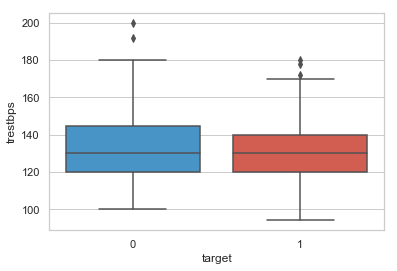

In [15]:
sns.boxplot(x=df['target'], y=df['trestbps'], palette=sns.color_palette(flatui_simple));

Trestbps seems not to be an important feature to discriminate between H.D. affected and not affected patients.

### Chol
Serum cholesterol. Measured in (mg/dl).

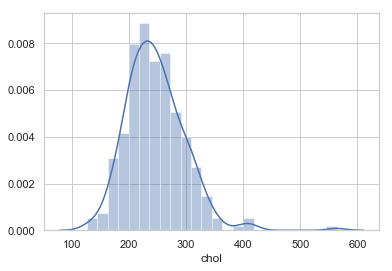

In [16]:
sns.distplot(df['chol'], kde=True, rug=False);

### Chol-Target

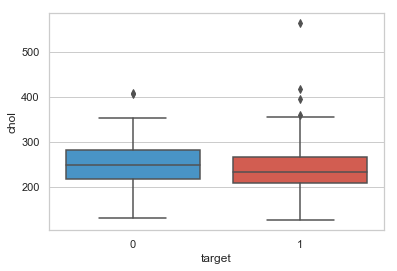

In [17]:
sns.boxplot(x=df['target'], y=df['chol'], palette=sns.color_palette(flatui_simple));

### CP: Chest Pain Type
From UCI Dataset description, this feature can assume 4 different values listed below:
> Value 1: typical angina<br>
> Value 2: atypical angina<br>
> Value 3: non-anginal pain<br>
> Value 4: asymptomatic<br> 

In [35]:
cp_unique = df.cp.unique()
cp_unique.sort()
print("'Chest Pain Type' feature unique values: ", cp_unique)
#df.cp.value_counts()

'Chest Pain Type' feature unique values:  [0 1 2 3]


Assuming:<br>
>0 ==> Value 1 <br>
>1 ==> Value 2 <br>
>2 ==> Value 3 <br>
>3 ==> Value 4 <br>


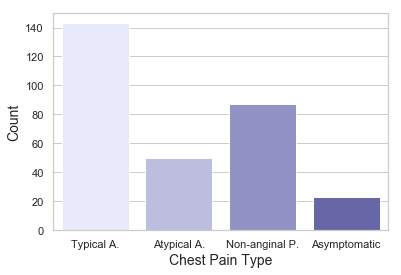

In [20]:
ax = sns.countplot(x='cp',data=df, palette=sns.light_palette("navy"));
ax.set_xticklabels(labels=['Typical A.','Atypical A.', 'Non-anginal P.', 'Asymptomatic']);
ax.set_xlabel("Chest Pain Type",fontsize=14); ax.set_ylabel("Count",fontsize=14);

### CP with respect to Target

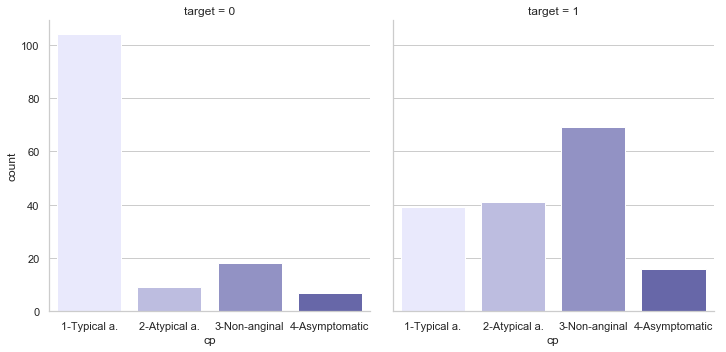

In [22]:
k = sns.catplot(x='cp', col='target', kind='count', data=df,  palette=sns.light_palette("navy"));
k.set(xticks=[0, 1, 2, 3], xticklabels=['1-Typical a.', '2-Atypical a.', '3-Non-anginal', '4-Asymptomatic']);

TODO: Considerations on Chest Pain Type here!

### Thal
Stands for Thalium stress test result (normal, fixed defect, or reversible defect)<br>
> Value 3: normal<br>
> Value 6: fixed defect<br>
> Value 7: reversible defect<br>

**N.B. The dataset description is not consistent with respect to 'Thal' attribute!**

In [49]:
thal_unique = df.thal.unique()
thal_unique.sort()
print("'Thal' feature unique values are: ", thal_unique)
print()
df.thal.value_counts()

'Thal' feature unique values are:  [0 1 2 3]



2    166
3    117
1     18
0      2
Name: thal, dtype: int64

Probably Thal attribute can be interpretated as follow:
> 0 ==> unknown <br>
> 1 ==> normal <br>
> 2 ==> fixed defect <br>
> 3 ==> reversible defect <br>

**But** if we accept this hypothesis we would have only 18 samples in our dataset with a 'normal' thalium stress test result.

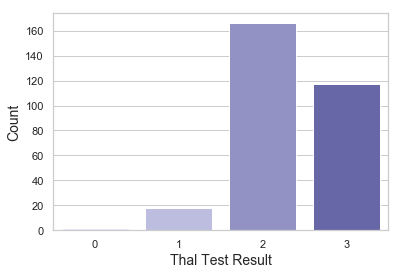

In [51]:
n = sns.countplot(x='thal',data=df, palette=sns.light_palette("navy"));
#n.set_xticklabels(labels=['unknown','Normal','Fixed Defect', 'Reversible Defect']);

#n.set_xticklabels(ax.get_xticklabels(), rotation=10, ha="right")  # xtickslabels rotation
#n.set_xticklabels(ax.get_xticklabels(), fontsize=10)  # xtickslabels font size

n.set_xlabel("Thal Test Result",fontsize=14); n.set_ylabel("Count",fontsize=14);

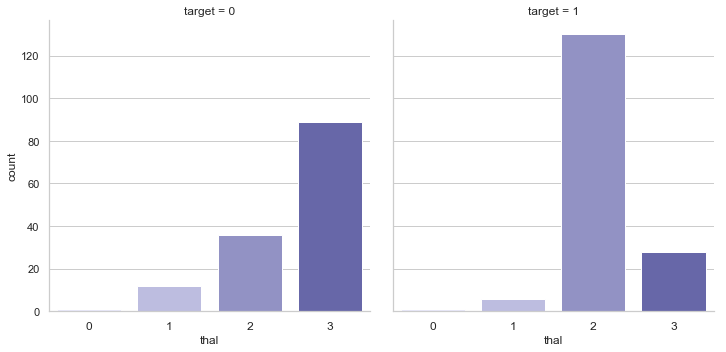

In [52]:
m = sns.catplot(x='thal', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
#m.set(xticks=[0, 1, 2, 3], xticklabels=['unknown', 'normal', 'fixed\ndefect', 'Reversible\ndefect']);
m.set_xticklabels(fontsize=12);

It's evident from the histograms above that the **majority of Heart Disease affected** samples are characterized by a **Thalium Stress Test Result of 'type 2'**.

### FBS
Fasting Blood Sugar (0 if < 120 mg/dl, 1 if > 120 mg/dl)

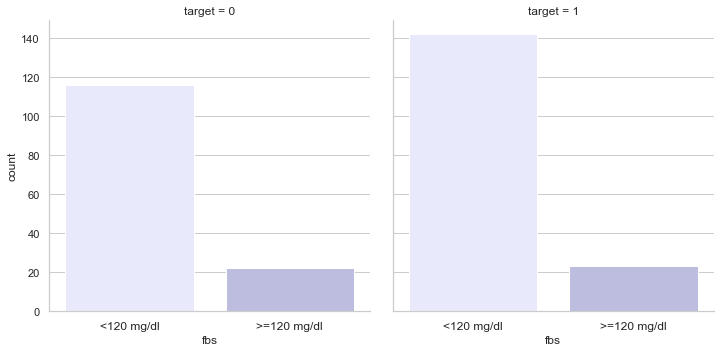

In [54]:
x = sns.catplot(x='fbs', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1], xticklabels=['<120 mg/dl', '>=120 mg/dl']);
x.set_xticklabels(fontsize=12);

### Restecg
Resting electrocardiographic results. Values:<br>
>**Value 0**: normal<br>
>**Value 1**: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)<br>
>**Value 2**: showing probable or definite left ventricular hypertrophy by Estes' criteria<br>

In [55]:
restecg_unique = df.restecg.unique()
restecg_unique.sort()
print("'restecg' feature unique values are: ", restecg_unique)
print()
df.restecg.value_counts()

'restecg' feature unique values are:  [0 1 2]



1    152
0    147
2      4
Name: restecg, dtype: int64

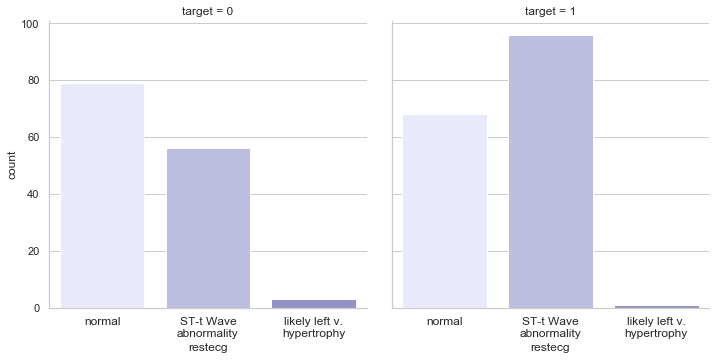

In [73]:
x = sns.catplot(x='restecg', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1, 2], xticklabels=['normal', 'ST-t Wave\nabnormality', 'likely left v.\nhypertrophy']);
x.set_xticklabels(fontsize=12);

### Exang *!
Exercise induced angina (1=yes or 0=no)	

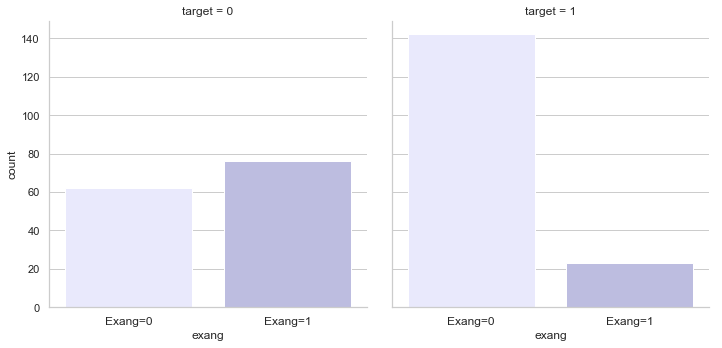

In [74]:
x = sns.catplot(x='exang', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1], xticklabels=['Exang=0', 'Exang=1']);
x.set_xticklabels(fontsize=12);

### Oldpeak ?? What is? What to do with this?
ST depression induced by exercise relative to rest

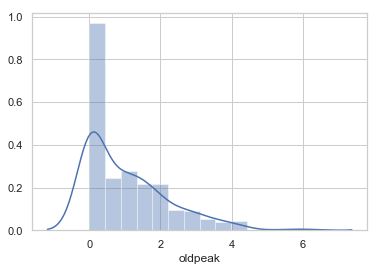

In [75]:
sns.distplot(df['oldpeak'], kde=True, rug=False);

### Slope
The slope of the peak exercise ST segment. Heart Rate slope during peak exercise? Values:<br>
>**Value 1**: downsloping<br>
>**Value 2**: flat<br>
>**Value 3**: upsloping<br>

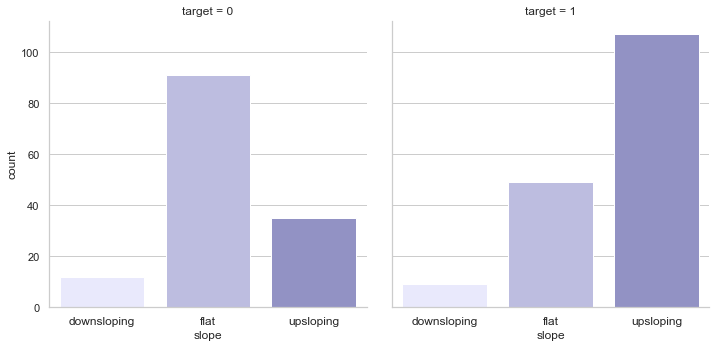

In [76]:
l=sns.catplot(x='slope', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
#l.set(xticks=[0, 1, 2], xticklabels=['upsloping', 'flat', 'downsloping']);
l.set(xticks=[0, 1, 2], xticklabels=['downsloping', 'flat', 'upsloping']);
l.set_xticklabels(fontsize=12);

### CA
When fluoroscopy is used during a cardiac catheterization, the physician can see how blood is moving through the blood vessels and where there are blockages.<br>
Number of major vessels **(0-3)** colored by flourosopy 

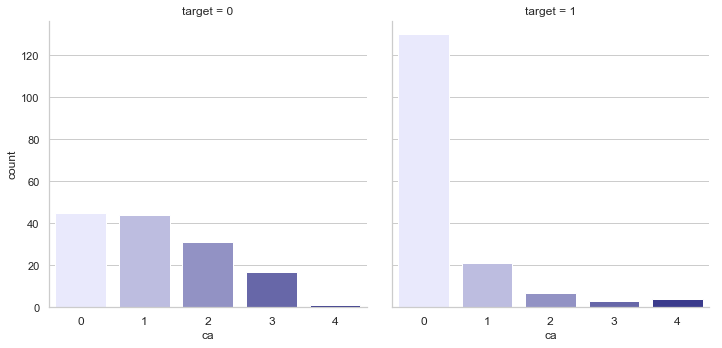

In [77]:
m=sns.catplot(x='ca', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
m.set_xticklabels(fontsize=12);

### Correlation Matrix

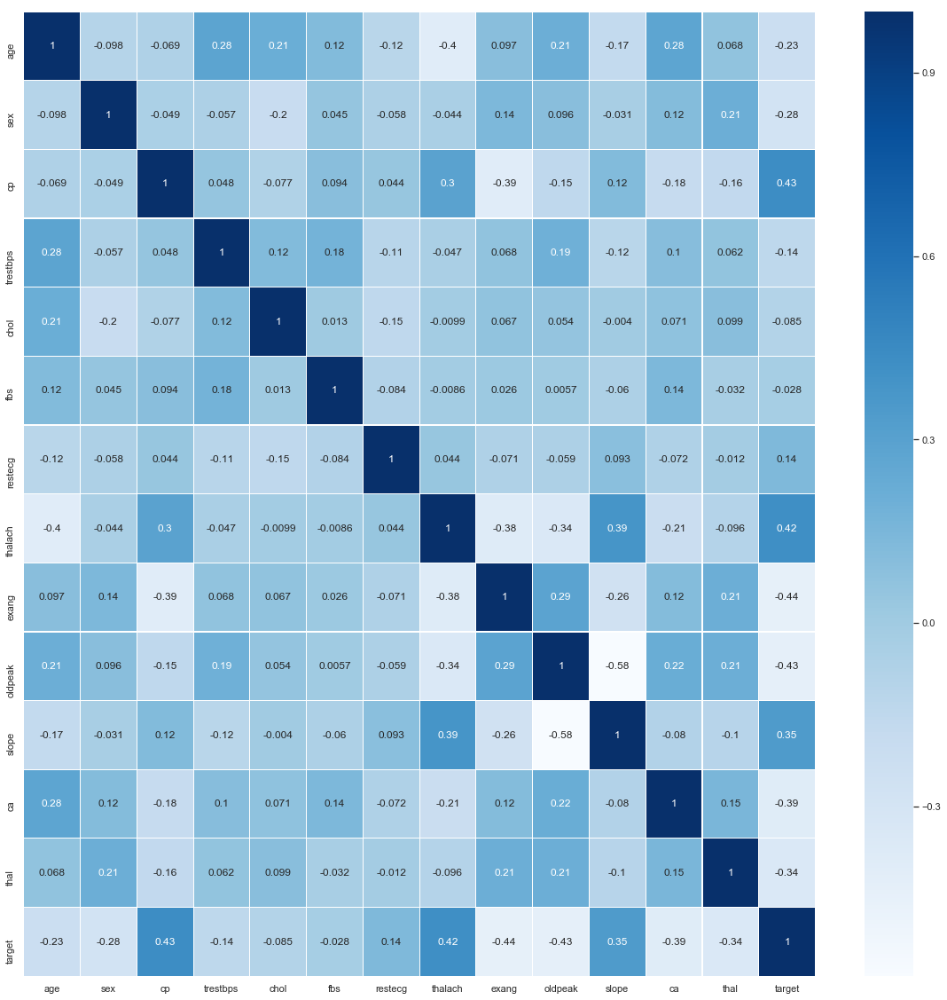

In [46]:
plt.figure(figsize=(20,20))
g=sns.heatmap(df.corr(), annot = True, cmap='Blues',linewidths=.1)
plt.show()

**Violin plot** is a variation of box plot. It shows the distribution of quantitative data across several levels of categorical variables. The violin plot also features a kde of the underlying distribution.
Violin plot is more informative than a plain box plot. While a box plot only shows summary statistics such as mean/median and interquartile ranges, the violin plot shows the full distribution of the data.<br>
**Thalac is compared against target.**
..<br>
see: https://datavizcatalogue.com/methods/violin_plot.html

In [ ]:
sns.violinplot(x='target', y='thalach', data=df, palette=sns.color_palette(flatui_simple));

In [ ]:
sns.violinplot(x='target', y='trestbps', data=df, palette=sns.color_palette(flatui_simple));

### 2. Preprocessing

In [78]:
pd.options.display.max_colwidth = 150
features_table = pd.read_csv("features_heart.csv")
display(features_table)

,Extracted Feature,Type,Description
0,age,Continuous,Age in years
1,sex,Binary,1 = male; 0 = female
2,cp,Categorical,"Chest pain type (typical angina, atypical angina, non-anginal, asymptomatic angina)"
3,trestbps,Continuous,Resting blood pressure (in mm Hg)
4,chol,Continuous,Serum cholesterol (in mg/dl)
5,fbs,Binary,"Fasting blood sugar (0 if < 120 mg/dl, 1 if > 120 mg/dl)"
6,restecg,Categorical,"0:normal, 1: ST-T wave abnormality, 2:left ventricular hypertrophy"
7,thalach,Continuous,Maximum heart rate achieved during thalium stress test
8,exang,Binary,"Exercise induced angina (1 = yes, 0 = no)"
9,oldpeak,Continuous,ST depression induced by exercise relative to rest


**Onehot Encoding**<br>
There are categorical data, we have to deal with!
One hot encoding is a representation of categorical variables as binary vectors.<br>
Categorical Features are: **cp, restecg, slope, thal**<br>
Transforming columns corresponding to categorical features into one hot.<br>
see https://stackoverflow.com/questions/37292872/how-can-i-one-hot-encode-in-python

**Onehot Encoding visual example needed here**

In [65]:
categorical_features = ['cp', 'restecg', 'slope', 'thal']
for feature in categorical_features:
    num_classes = len(df[feature].unique())
    curr_onehot = pd.get_dummies(df[feature], prefix='en_' + feature)
    df = df.drop(feature, axis=1)
    df = df.join(curr_onehot)

Dataset normalization

In [66]:
from sklearn.preprocessing import StandardScaler
X = df[df.columns[:-1]].values  # from encoded dataframe
y = df["target"].values
# Fai vedere come non normalizzando c'è outlier a (300, -10)
X_std = StandardScaler(with_mean=True, with_std=True).fit_transform(X)  # Normalization: Mean=0; Variance=1

### Principle Component Analysis

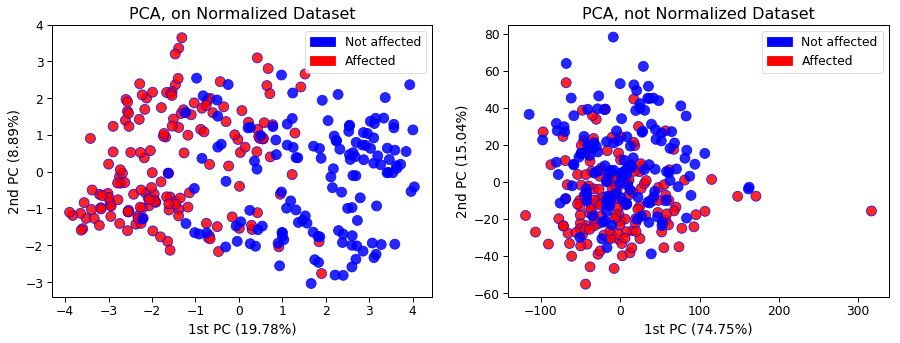

In [67]:
from sklearn.decomposition import PCA
import matplotlib.patches as mpatches

pca, pca1 = PCA(n_components=2), PCA(n_components=2) # all components
X_t = pca.fit_transform(X_std)  # with normalization
X_t1 = pca1.fit_transform(X)  # without normalization, presence of Outliers, this impact on PC1 p.v.e

# Label to color dict (manual)
label_color_dict = {0: 'blue', 1: 'red'}
# Color vector creation
cvec = [label_color_dict[label] for label in y]
# Legend
negative_patch = mpatches.Patch(color='blue', label='Not affected')
positive_patch = mpatches.Patch(color='red', label='Affected')
# 1st and 2nd Components Scatter
fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(121)
ax.set_xlabel('1st PC (%.2f%%)' % (pca.explained_variance_ratio_[0] * 100))
ax.set_ylabel('2nd PC (%.2f%%)' % (pca.explained_variance_ratio_[1] * 100))
ax.set_title('PCA, on Normalized Dataset', fontsize=16)
ax.scatter(X_t[:, 0], X_t[:, 1], c=cvec, edgecolor='b', alpha=0.85, s=100)
ax.legend(handles=[negative_patch, positive_patch])
ax1 = fig.add_subplot(122)
ax1.set_xlabel('1st PC (%.2f%%)' % (pca1.explained_variance_ratio_[0] * 100))
ax1.set_ylabel('2nd PC (%.2f%%)' % (pca1.explained_variance_ratio_[1] * 100))
ax1.set_title('PCA, not Normalized Dataset', fontsize=16)
ax1.scatter(X_t1[:, 0], X_t1[:, 1], c=cvec, edgecolor='b', alpha=0.85, s=100)
ax1.legend(handles=[negative_patch, positive_patch])
plt.show()

### Considerations

cons..

## 2. Classification

Spiegare cross validation: ...
    

Utility Functions for decision regions plotting:

In [69]:
def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in
    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional
    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy


def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.
    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

Splitting the dataset into Training Set and Test Set

In [70]:
# Considering only first two components
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_t, y, test_size=0.40, random_state=0)
print(X_train.shape); print(y_train.shape)

(181, 2)
(181,)


## 2.1 K-Nearest Neighbors

https://www.analyticsvidhya.com/blog/2018/03/introduction-k-neighbours-algorithm-clustering/

In [103]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

#k_values = [1, 2, 3, 6, 9, 12, 20, 30, 40]
k_values = [1, 2, 3, 10, 20, 30, 40, 50, 70, 100]
#weights_values = ["uniform", "distance"]
#tuned_parameters = {'n_neighbors': k_values, 'weights': weights_values}
tuned_parameters = {'n_neighbors': k_values}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn, tuned_parameters , cv=5, refit=True, return_train_score=True)
knn_cv.fit(X_train, y_train)
print('GridSearchCV 12-Fold on Training Set')
print('Best_parameters are: ', knn_cv.best_params_)

# Remember that this time we are doing cross validation with k=5 to choose
# the best parameters ==> we get mean_score
# Mean cross-validated score of the best_estimator
accuracy = 100 * float(knn_cv.best_score_)
print('Accuracy Score (AVG on all folds scores) is: %.03f%% ' % accuracy)

# best estimator is accessible by "clf.best_estimator_" if refit=TRUE
y_pred = knn_cv.best_estimator_.predict(X_test)
score = 100 * metrics.accuracy_score(y_test, y_pred)
# print("knn_cv - With best params from GridSearchCV [%d , %s]\nAccuracy Score on Test Set is %.2f%%" %
#     (knn_cv.best_params_['n_neighbors'], knn_cv.best_params_['weights'], score))
print("knn_cv - With best params from GridSearchCV [n_neighbors=%d]\nAccuracy Score on Test Set is %.2f%%" %
      (knn_cv.best_params_['n_neighbors'], score))

GridSearchCV 12-Fold on Training Set
Best_parameters are:  {'n_neighbors': 40}
Accuracy Score (AVG on all folds scores) is: 88.679% 
knn_cv - With best params from GridSearchCV [n_neighbors=40]
Accuracy Score on Test Set is 84.62%


In [107]:
#GridSearch_table_plot(clf_cv, "n_neighbors", negative=False);

In [106]:
#['params', 'rank_test_score', 'mean_train_score', 'mean_test_score'])
df_cv = pd.DataFrame(clf_cv.cv_results_)
cv_mean_train_scores = 100*(df_cv['mean_train_score'].values)  # df is actually sorted by "param_n_neighbors"
cv_mean_test_scores = 100*(df_cv['mean_test_score'].values)
df_cv = df_cv[['param_n_neighbors', 'rank_test_score','mean_train_score','mean_test_score']].sort_values(by=['rank_test_score'])
display(df_cv)

,param_n_neighbors,rank_test_score,mean_train_score,mean_test_score
6,40,1,0.882066,0.886792
7,50,2,0.878543,0.882075
8,70,2,0.879692,0.882075
4,20,4,0.870266,0.872642
9,100,4,0.877346,0.872642
3,10,6,0.878557,0.867925
5,30,6,0.877346,0.867925
2,3,8,0.903312,0.849057
0,1,9,1.000000,0.830189
1,2,10,0.904537,0.816038


Best value for k is obtained by doing cross-validation with k=5 folds. Best parameter is the one with the maximum mean_test_score.<br>
**mean_test_score** is the average of Test Scores on all **k folds**.<br>
<br>
**Meaning of mean_train_score and mean_test_score**<br>
When you do k-fold cross-validation, you train k models, each one leaving 1/𝑘 portion of the data out. For each of the models, you can compute its train error and validation error. The train error will be the error on the data selected to train the model, and the validation error will be the data left out of the training.<br>
For this reason, for each parameters set, you'll have k training errors and k validation/test errors, and computing their averages will give you respectively: mean_train_score and mean_test_score.<br>
N.B.<br>
<br>
Domanda + risposta:
Could you be more precise about train error? I don't get it - if you train model based on some data and then you use this set of data to test model, you should have 100% accurate model - right?
<br>Risposta:<br>
No, in general training accuracy is lower than 100%. Take logistic regression, unless your data are linearly separable your training accuracy will be lower than 100%.<br>
fonte:https://datascience.stackexchange.com/questions/31291/gridsearch-mean-test-score-vs-mean-train-score

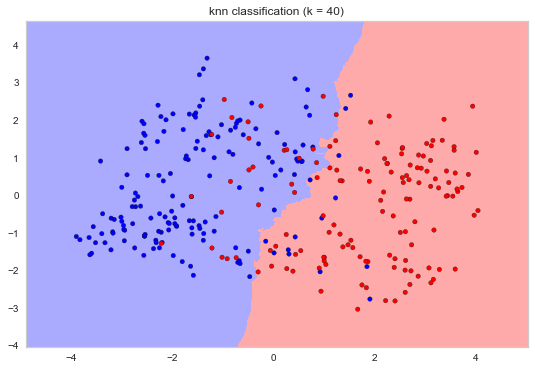

In [108]:
import numpy as np
# Plotting decision regions
from matplotlib.colors import ListedColormap
h = .02  # step size in the mesh
# two class classification target[0, 1]
cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
cmap_bold = ListedColormap(['#FF0000', '#0000FF'])
x_min, x_max = X_t[:, 0].min() - 1, X_t[:, 0].max() + 1
y_min, y_max = X_t[:, 1].min() - 1, X_t[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                    np.arange(y_min, y_max, h))
Z = clf_cv.best_estimator_.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(9, 6))
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)
# Plot the training points
plt.scatter(X_t[:, 0], X_t[:, 1], c=y, cmap=cmap_bold,
            edgecolor='k', s=20)
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.title("knn classification (k = %d)" % clf_cv.best_params_['n_neighbors'])
plt.show()

#### Scores on Test Set for different K values

In [109]:
k_test_scores = []  # scores on Test Set for different K values, with 'uniform' weights
clf_vect = []  # vector containing fitted classifier for each k value
for k in k_values:
    curr_clf = KNeighborsClassifier(n_neighbors=k, weights='uniform')
    curr_clf.fit(X_train, y_train)
    clf_vect.append(curr_clf)
    y_pred = curr_clf.predict(X_test)
    score = 100 * metrics.accuracy_score(y_test, y_pred)
    k_test_scores.append(score)

In [113]:
# Plotly graph
configure_plotly_browser_state()
init_notebook_mode(connected=False)

trace0 = Scatter(
    x = k_values,
    y = k_test_scores,
    mode = 'lines+markers',
    name = '<b>Score on Test Set</b>',
    line = dict(
        color = ('rgb(255,0,0)'), # red
        width = 4)
      )

trace1 = Scatter(
    x = k_values,
    y = cv_mean_train_scores,
    #mode = 'lines+markers',
    mode = 'lines',
    name = 'Mean Train Score',
    line = dict(
        color = ('rgb(49,130,189)'), # light blue
        width = 4)
      )
trace2 = Scatter(
    x = k_values,
    y = cv_mean_test_scores,
    mode = 'lines+markers',
    name = 'Mean Test Score',
    line = dict(
        color = ('rgb(47,79,79)'), # grey
        width = 3)
      )

# With subplot
fig = tools.make_subplots(rows=2, cols=1,subplot_titles=('<b>Cross-Validation Scores</b>',
                                                         '<b>Scores on Test Set</b>'), shared_xaxes=True)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 1)
fig.append_trace(trace0, 2, 1)
fig['layout'].update(title='KNN Scores') # in there height=600, width=600,
fig['layout']['xaxis'].update(title='K Value') #shared axis X
iplot(fig, filename='stacked-knn-scores')

#Oppure
#data = [trace0, trace1, trace2]
#layout = dict(title = 'KNN Scores',
#              xaxis = dict(title = 'K value'),
#              yaxis = dict(title = 'Score'),
#              )
#fig = dict(data=data, layout=layout)
#iplot(fig, filename='k_score_plot')

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]



### Decision Region for each K Value

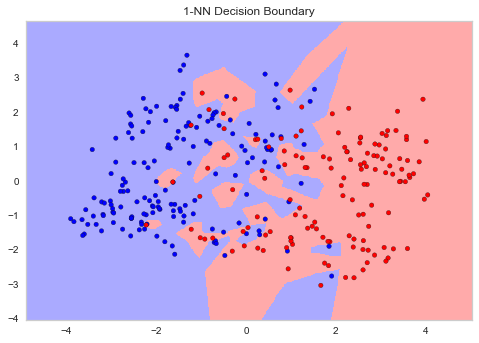

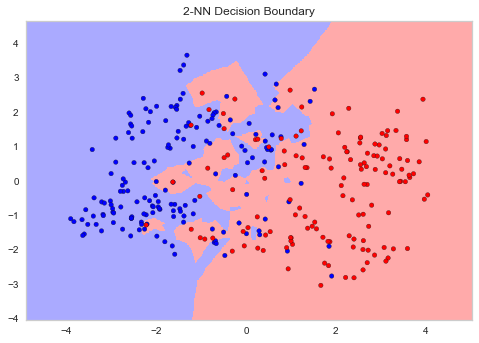

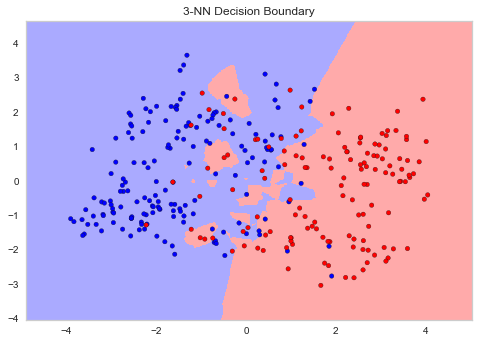

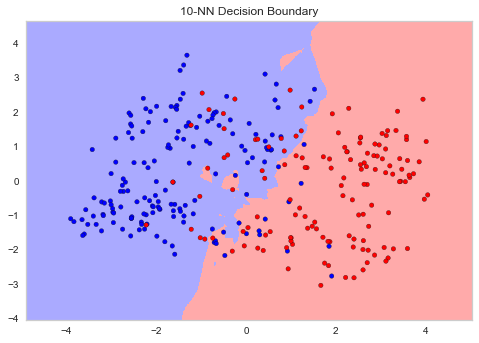

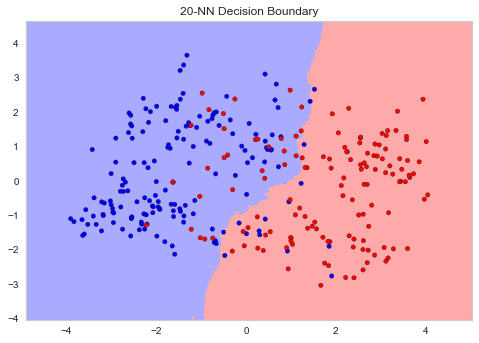

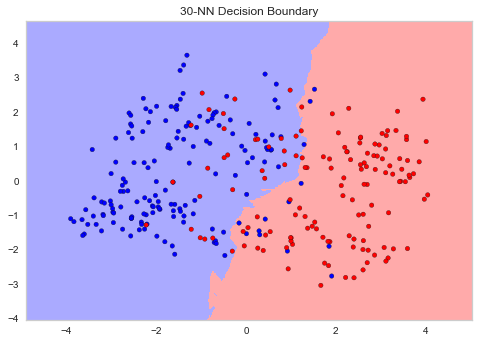

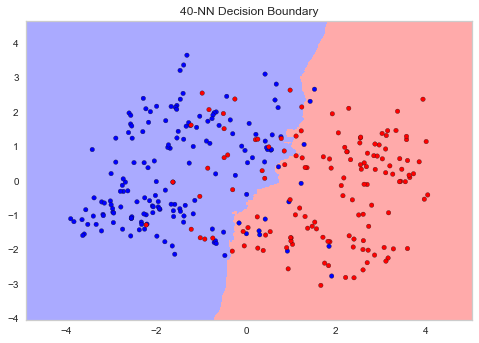

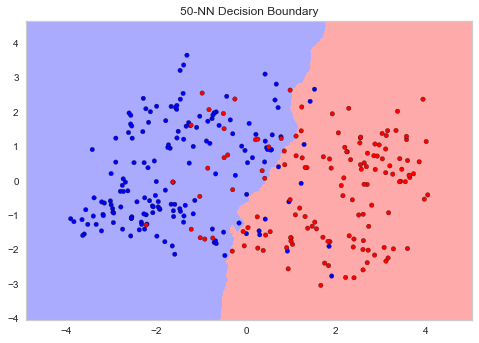

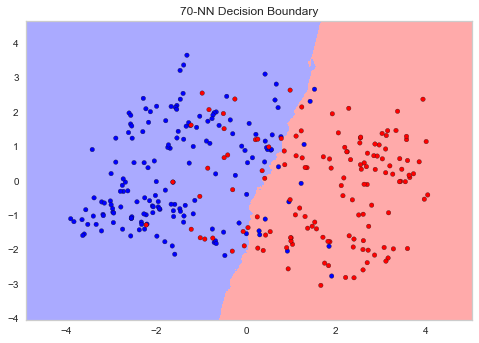

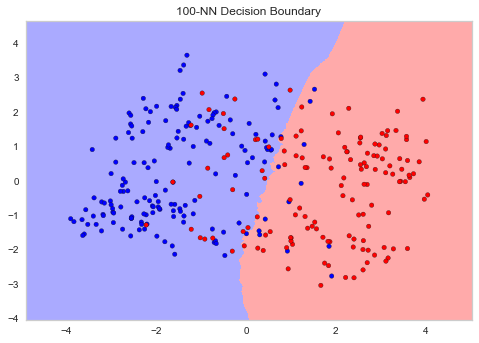

In [114]:
import numpy as np
# Plotting decision regions
from matplotlib.colors import ListedColormap
h = .02  # step size in the mesh
# Create color maps
# cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF'])
# cmap_bold = ListedColormap(['#FF0000', '#0000FF', '#00FF00'])
# two class classification target[0, 1]
cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
cmap_bold = ListedColormap(['#FF0000', '#0000FF'])

for (k, clf) in zip(k_values, clf_vect):
    # we create an instance of Neighbours Classifier and fit the data.
    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X_t[:, 0].min() - 1, X_t[:, 0].max() + 1
    y_min, y_max = X_t[:, 1].min() - 1, X_t[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
    plt.scatter(X_t[:, 0], X_t[:, 1], c=y, cmap=cmap_bold,
                edgecolor='k', s=20)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title("%d-NN Decision Boundary" % k)

#### Consideration on KNN Decision Boundaries

K-nearest neighbors works assigning a label to a sample depending on the k nearest data points labels.<br>Once found the group of k nearest training samples to our target data point (can be a test sample/point) the label given to the target will be the most spread label among all the k nearest. Like a majority voting!<br> 
will assign a class to a value depending on its k nearest training data points in Euclidean space, where k is some number chosen by the user.<br>
From the plots is visible that **increasing value of K leads to smoother boundary**. With K increasing to infinity the margin will be all blue or all red depending on the total majority.<br>
fonte: https://www.analyticsvidhya.com/blog/2018/03/introduction-k-neighbours-algorithm-clustering/

## 2.2 Support Vector Machine

In [115]:
# Considering only first two components
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_t, y, test_size=0.30, random_state=0)
print(X_train.shape); print(y_train.shape)

(212, 2)
(212,)


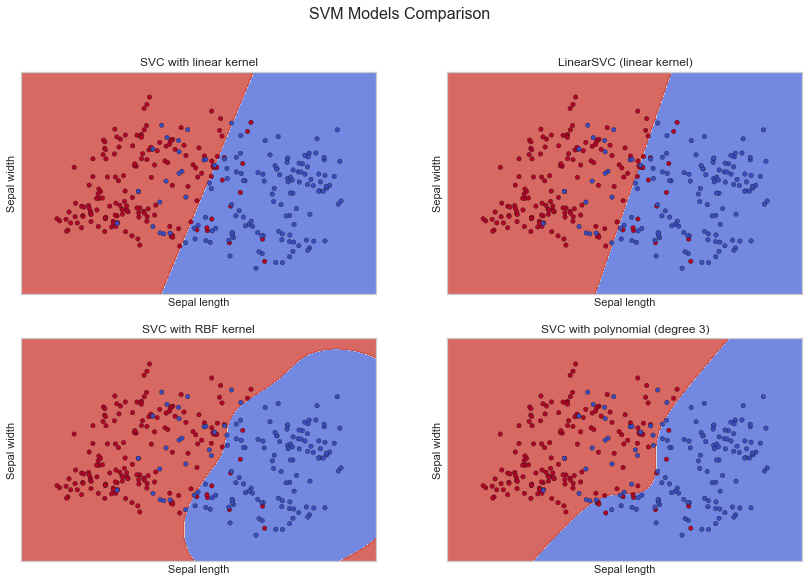

In [116]:
from sklearn import svm

C = 1.0  # SVM regularization -hyperparameter
# training different SVM models
models = (svm.SVC(kernel='linear', C=C),
          svm.LinearSVC(C=C),
          svm.SVC(kernel='rbf', gamma=0.7, C=C),
          svm.SVC(kernel='poly', degree=3, C=C))

models = (clf.fit(X_t, y) for clf in models)
# title for the plots
titles = ('SVC with linear kernel',
          'LinearSVC (linear kernel)',
          'SVC with RBF kernel',
          'SVC with polynomial (degree 3)')

fig, sub = plt.subplots(2, 2, figsize=(14,9))
fig.suptitle('SVM Models Comparison', size=16) # or plt.suptitle('Main title')
plt.subplots_adjust(wspace=0.2, hspace=0.2)
X0, X1 = X_t[:, 0], X_t[:, 1]
xx, yy = make_meshgrid(X0, X1)
for clf, title, ax in zip(models, titles, sub.flatten()):
    plot_contours(ax, clf, xx, yy,
                  cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('Sepal length')
    ax.set_ylabel('Sepal width')
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)
plt.show()

### SVM with RBF Kernel: C and Gamma Cross-Validation

In [117]:
C = [10 ** -1, 10 ** 0, 10 ** 1, 10 ** 2, 10 ** 3]
gamma = [10 ** -2, 10 ** -1, 10 ** 0, 10 ** 1]
tuned_parameters = {'C': C, 'gamma': gamma}

In [118]:
#Gridsearch for SVM with RBF Kernel
# rbf kernel - using GridSearchCV, performing 5-fold validation (cv=5)
clf2 = GridSearchCV(svm.SVC(kernel='rbf'), tuned_parameters, cv=5, refit=True, return_train_score=True)
clf2.fit(X_train, y_train)

# We are doing cross validation with k=5 to choose
# the best parameters ==> we get mean_score (mean on all folds score)
# Mean cross-validated score of the best_estimator
print('GridSearchCV 5-Fold on Training Set.\nBest_params= %s with best_score_= %.03f'%
      (clf2.best_params_, 100*float(clf2.best_score_)))


GridSearchCV 5-Fold on Training Set.
Best_params= {'C': 1, 'gamma': 0.1} with best_score_= 88.679


In [119]:
#['params', 'rank_test_score', 'mean_train_score', 'mean_test_score'])
df_svm_cv = pd.DataFrame(clf2.cv_results_)
# selecting only the interesting columns
df_svm_cv = df_svm_cv[['params', 'rank_test_score','mean_train_score','mean_test_score']].sort_values(by=['rank_test_score'])
# cv_svm_train_scores = 100*(df_svm_cv['mean_train_score'].values)
# cv_sv_test_scores = 100*(df_svm_cv['mean_test_score'].values)
display(df_svm_cv)

,params,rank_test_score,mean_train_score,mean_test_score
16,"{'C': 1000, 'gamma': 0.01}",1,0.880882,0.886792
13,"{'C': 100, 'gamma': 0.1}",1,0.880883,0.886792
5,"{'C': 1, 'gamma': 0.1}",1,0.885609,0.886792
9,"{'C': 10, 'gamma': 0.1}",4,0.879692,0.882075
12,"{'C': 100, 'gamma': 0.01}",4,0.879685,0.882075
4,"{'C': 1, 'gamma': 0.01}",4,0.885595,0.882075
8,"{'C': 10, 'gamma': 0.01}",4,0.886793,0.882075
0,"{'C': 0.1, 'gamma': 0.01}",8,0.879706,0.877358
1,"{'C': 0.1, 'gamma': 0.1}",8,0.884419,0.877358
17,"{'C': 1000, 'gamma': 0.1}",10,0.879706,0.872642


In [88]:
# best estimator is accessible by "clf2.best_estimator_" if refit=TRUE
y_pred = clf2.best_estimator_.predict(X_test)
score = 100 * metrics.accuracy_score(y_test, y_pred)
print("SVM RBF - best params from GridSearchCV are: [%.3f , %.3f], accuracy Score on Test Set is: %.2f%%" %
      (clf2.best_params_['C'], clf2.best_params_['gamma'], score))

SVM RBF - best params from GridSearchCV are: [1.000 , 0.100], accuracy Score on Test Set is: 82.42%


Text(0.5,1,'GridSearchCV 5-Fold Validation\nChosen C = 1.00, Chosen Gamma = 0.100')

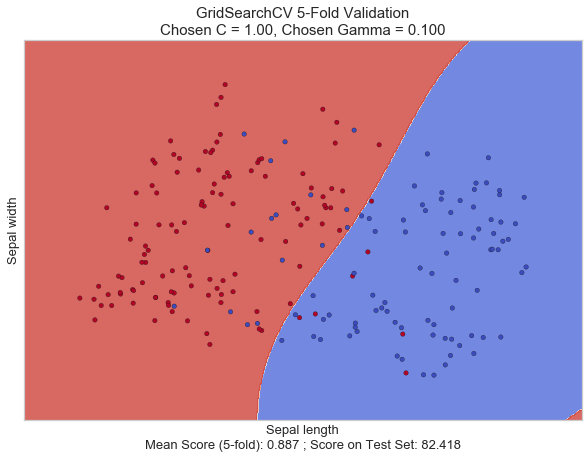

In [89]:
# Plotting decision boundaries:
X0, X1 = X_train[:, 0], X_train[:, 1]
xx, yy = make_meshgrid(X0, X1)
fig2 = plt.figure(2, figsize=(10, 7))
ax3 = fig2.add_subplot(111)
plot_contours(ax3, clf2.best_estimator_, xx, yy,  # using Best estimator
              cmap=plt.cm.coolwarm, alpha=0.8)
ax3.scatter(X0, X1, c=y_train, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
ax3.set_xlim(xx.min(), xx.max())
ax3.set_ylim(yy.min(), yy.max())
# scores x label
ax3.set_xlabel('Sepal length\nMean Score (5-fold): %.03f ; Score on Test Set: %.03f' % (clf2.best_score_, score), fontsize=13)
ax3.set_ylabel('Sepal width', fontsize=13)
ax3.set_xticks(())
ax3.set_yticks(())
ax3.set_title(
    'GridSearchCV %d-Fold Validation\nChosen C = %.02f, Chosen Gamma = %.03f' % (5, clf2.best_params_['C'], clf2.best_params_['gamma']), fontsize=15)


### SVM with RBF Kernel: Boundaries Analysis

Plotting all decision boundaries

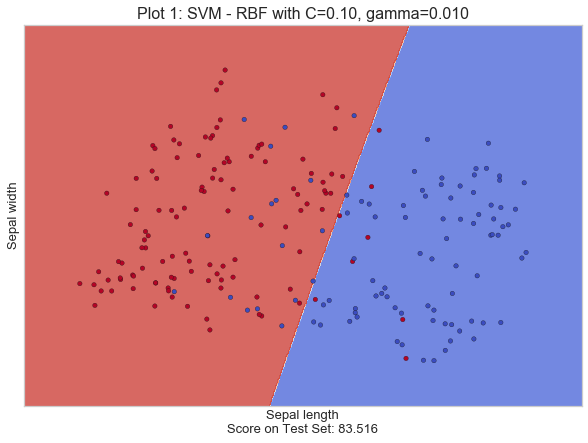

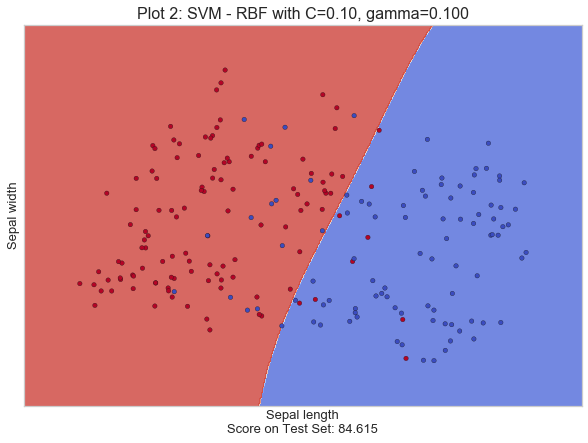

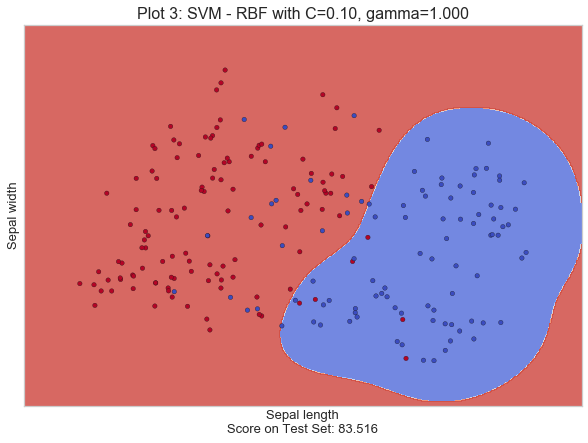

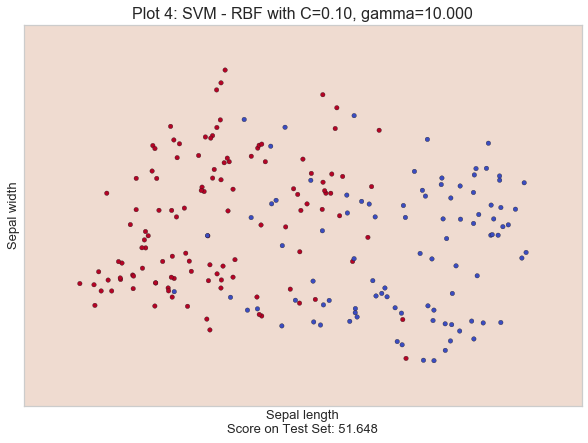

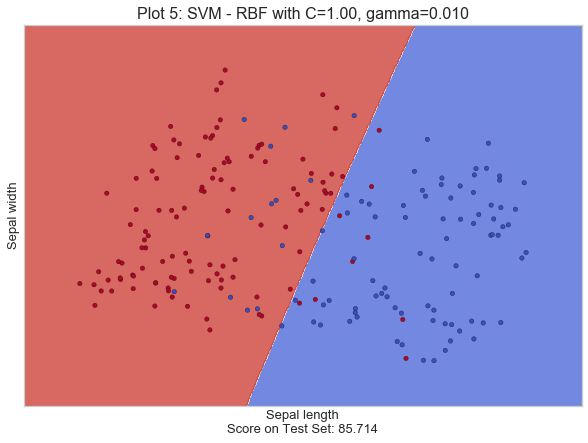

...

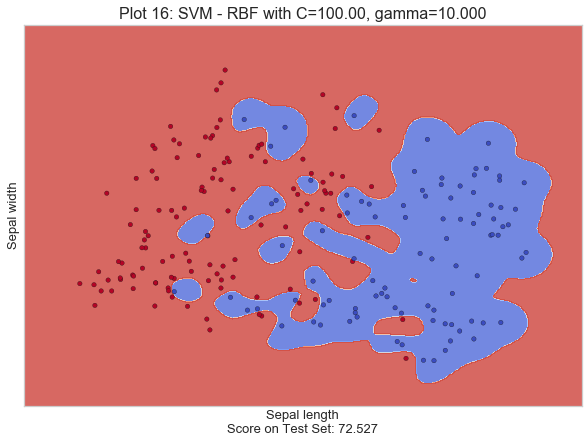

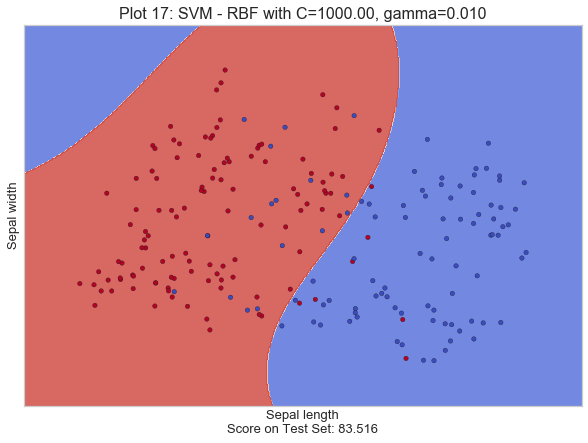

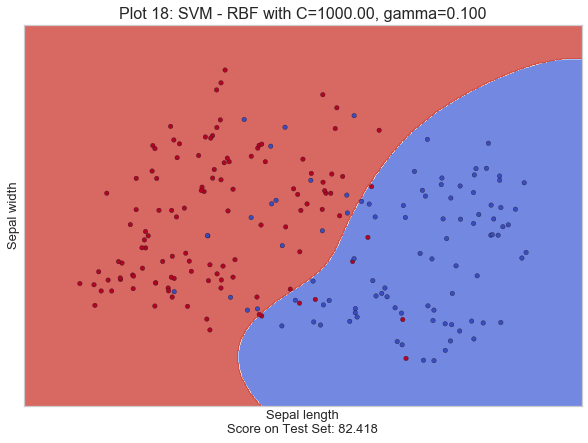

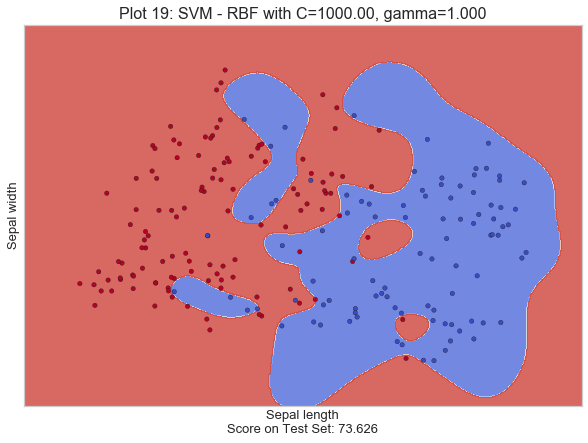

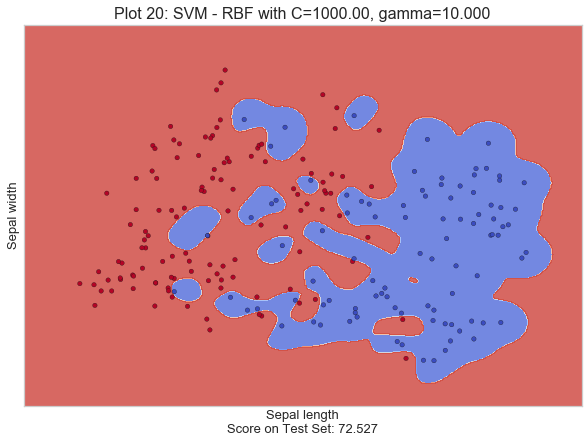

In [90]:
i = 1
for C_value in C:
    for gamma_value in gamma:
        curr_clf = svm.SVC(kernel='rbf', gamma=gamma_value, C=C_value)
        curr_clf.fit(X_train, y_train)
        curr_pred = curr_clf.predict(X_test)
        score = 100 * metrics.accuracy_score(y_test, curr_pred)
        X0, X1 = X_train[:, 0], X_train[:, 1]
        xx, yy = make_meshgrid(X0, X1)
        fig = plt.figure(figsize=(10, 7))
        ax = fig.add_subplot(111)
        plot_contours(ax, curr_clf, xx, yy,
                      cmap=plt.cm.coolwarm, alpha=0.8)
        ax.scatter(X0, X1, c=y_train, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        # scores x label
        ax.set_xlabel(
            'Sepal length\nScore on Test Set: %.03f' % (score),
            fontsize=13)
        ax.set_ylabel('Sepal width', fontsize=13)
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(
            'Plot %d: SVM - RBF with C=%.02f, gamma=%.03f' % (i, C_value, gamma_value), fontsize=16)
        plt.show()
        i += 1

Considerations on decision boundaries! TO DO!